# Preparation

In [1]:
!pip install --upgrade pandas
!pip install backtesting
!pip install pytorch-tabnet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.2 MB 17.1 MB/s 
  Attempting uninstall: pandas
    Found existing installation: pandas 1.3.5
    Uninstalling pandas-1.3.5:
      Successfully uninstalled pandas-1.3.5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 175 kB 5.4 MB/s 
  Created wheel for backtesting: filename=Backtesting-0.3.3-py3-none-any.whl size=173833 sha256=f7057d1fd12561a01dd7ded40f761ab772e2ead3a7089fce1fd011720090ecde
  Stored in directory: /root/.cache/pip/wheels/cd/5c/f7/aafe95c37f8b07f838fb0a8cb3177de23a38c09cbd10b447b8
Successfully built backtesting
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 733 kB/s 


In [2]:
from google.colab import drive
drive.mount('/content/drive')
DATA_DIR="/content/drive/MyDrive/capstone-crypto-team4/Data"


Mounted at /content/drive


In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn import linear_model
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA

In [4]:
import torch
from torch import nn
from torch.nn import functional as F
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

from torch.utils.data import TensorDataset, DataLoader

import torch.optim as optim


In [5]:
def plot_confusion_matrix(y_pred, y_test):
    sentiment_classes = ['Negative', 'Positive']
    cm = confusion_matrix(y_test, y_pred)    
    # plot confusion matrix
    # plt.figure(figsize=(8,6))
    sns.heatmap(cm, cmap=plt.cm.Blues, annot=True, fmt='d', 
                xticklabels=sentiment_classes,
                yticklabels=sentiment_classes)
    plt.title('Confusion matrix', fontsize=16)
    plt.xlabel('Predicted label', fontsize=12)
    plt.ylabel('Actual label', fontsize=12)

In [5]:
from backtesting import Backtest
from backtesting.lib import SignalStrategy

/usr/local/lib/python3.8/dist-packages/backtesting/_plotting.py:50: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


In [6]:
import warnings
warnings.filterwarnings("ignore")

In [7]:
# Trading Strategy: Buy (Sell) when the state changes to 1 (-1). Close out all positions when the state changes. Do nothing when the state holds.
class TradingStrategy(SignalStrategy):
    def init(self):
        super().init()
    def next(self):
        if self.data['label'][-2] != self.data['label'][-1]:
            if self.position:
                self.position.close()
        if self.data['label'][-1] == 1:
            self.buy()
        elif self.data['label'][-1] == -1:
            self.sell()

def backtesting(df_px_label, cash = 1000000, commission=0.0025, TradingStrategy = TradingStrategy, plotGraph=True):
    ###  df_px_label is a dataframe with column 'State' and 'Close' ###
    if ~np.isin(['label','Close'], df_px_label.columns).all():
        ValueError("backtesting: Dataframe input must contain columns with name 'label' and 'Close' ")

    bt = Backtest(df_px_label,  TradingStrategy,cash=cash, commission=commission,trade_on_close=True)
    stats = bt.run()
    if plotGraph:
        bt.plot()
        print(stats)
    return bt, stats#, df_px_label

def backtesting_df(df, close_name, label_name, cash = 1000000, commission=0.00, TradingStrategy = TradingStrategy, plotGraph=True):
    return backtesting(df, cash , commission, TradingStrategy, plotGraph)

# Data

## Load Data

In [8]:
# CDL factors in technical indicators
CDL = ['CDL2CROWS', 'CDL3BLACKCROWS', 'CDL3INSIDE', 'CDL3LINESTRIKE', 'CDL3OUTSIDE', 'CDL3STARSINSOUTH', 'CDL3WHITESOLDIERS', 'CDLABANDONEDBABY', 'CDLADVANCEBLOCK', 'CDLBELTHOLD', 'CDLBREAKAWAY', 'CDLCLOSINGMARUBOZU',
       'CDLCONCEALBABYSWALL', 'CDLCOUNTERATTACK', 'CDLDARKCLOUDCOVER', 'CDLDOJI', 'CDLDOJISTAR', 'CDLDRAGONFLYDOJI', 'CDLENGULFING', 'CDLEVENINGDOJISTAR', 'CDLEVENINGSTAR', 'CDLGAPSIDESIDEWHITE', 'CDLGRAVESTONEDOJI',
       'CDLHAMMER', 'CDLHANGINGMAN', 'CDLHARAMI', 'CDLHARAMICROSS', 'CDLHIGHWAVE', 'CDLHIKKAKE', 'CDLHIKKAKEMOD', 'CDLHOMINGPIGEON', 'CDLIDENTICAL3CROWS', 'CDLINNECK', 'CDLINVERTEDHAMMER', 'CDLKICKING', 'CDLKICKINGBYLENGTH',
       'CDLLADDERBOTTOM', 'CDLLONGLEGGEDDOJI', 'CDLLONGLINE', 'CDLMARUBOZU', 'CDLMATCHINGLOW', 'CDLMATHOLD', 'CDLMORNINGDOJISTAR', 'CDLMORNINGSTAR', 'CDLONNECK', 'CDLPIERCING', 'CDLRICKSHAWMAN', 'CDLRISEFALL3METHODS',
       'CDLSEPARATINGLINES', 'CDLSHOOTINGSTAR', 'CDLSHORTLINE', 'CDLSPINNINGTOP', 'CDLSTALLEDPATTERN', 'CDLSTICKSANDWICH', 'CDLTAKURI', 'CDLTASUKIGAP', 'CDLTHRUSTING', 'CDLTRISTAR', 'CDLUNIQUE3RIVER', 'CDLUPSIDEGAP2CROWS',
       'CDLXSIDEGAP3METHODS']

def price_data(ticker, freq, if_CDL=False):
  '''
  price & technical indicators
  '''
  df = pd.read_hdf(DATA_DIR+f"/price/price+tech/{ticker}-{freq}.h5")
  if not if_CDL:
    return df.loc[:, ~df.columns.isin(CDL)]
  else:
    return df

def senti_data(freq):
  '''
  sentiment data: [mean, sum, std, count] of sentiment score
  '''
  return pd.read_pickle(DATA_DIR+f"/reddit/reddit_senti_{freq}.pkl")

def price_senti(ticker, freq, if_CDL=False):
  df = price_data(ticker, freq, if_CDL)
  senti = senti_data(freq)
  senti.rename(columns={x: 'senti_'+x for x in senti.columns}, inplace=True)
  df = df.join(senti, how='left')
  df = df.fillna(0)
  return df

## Price

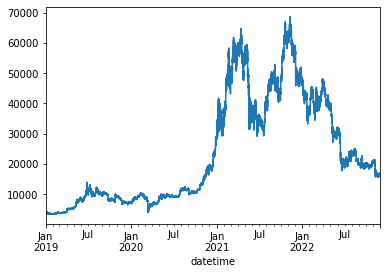

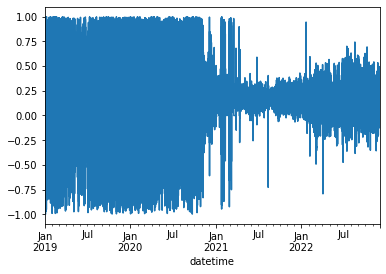

,open,high,low,close,volume,amount,count,HT_DCPERIOD,HT_DCPHASE,HT_PHASOR_inphase,...,ATR,NATR,TRANGE,AD,ADOSC,OBV,senti_mean,senti_sum,senti_std,senti_count
datetime,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,3687.59,3707.50,3684.34,3702.46,277.117928,1.024861e+06,1567.0,23.818607,136.309463,19.549684,...,12.957279,0.349964,23.19,138167.709234,24.641806,-222546.898576,0.370833,1.1125,0.496273,3.0
2019-01-01 00:10:00,3702.44,3702.63,3689.88,3696.13,140.201131,5.181347e+05,876.0,23.737223,147.010216,20.873913,...,12.942473,0.350163,12.75,138164.960192,30.282215,-222687.099707,-0.078967,-0.2369,0.627788,3.0
2019-01-01 00:20:00,3695.16,3698.93,3691.74,3692.95,91.961217,3.398784e+05,748.0,23.355511,158.516285,10.443363,...,12.531582,0.339338,7.19,138103.951151,10.424759,-222779.060924,0.000000,0.0000,0.000000,1.0
2019-01-01 00:30:00,3692.98,3695.98,3690.56,3695.00,78.661768,2.905013e+05,656.0,22.849582,166.509573,2.743398,...,12.023612,0.325402,5.42,138154.166966,17.331309,-222700.399156,0.000000,0.0000,0.000000,0.0
2019-01-01 00:40:00,3695.38,3705.00,3693.38,3699.88,89.703349,3.318452e+05,999.0,22.428604,178.452713,-4.575417,...,11.994783,0.324194,11.62,138164.820204,21.970808,-222610.695807,-0.153100,-0.1531,0.000000,1.0


In [10]:
data_set = price_senti('BTCUSDT', '10min')

data_set.loc['2019-01-01':, 'close'].plot()
plt.show()

data_set.loc['2019-01-01':, 'senti_mean'].plot()
plt.show()

data_set.loc['2019-01-01':].head()

## Preprocess Data
Preprocess & Train / Validation / Test split

In [11]:
def make_3d(x, y, lag):
  '''
  make 3d array for LSTM
  '''
  return np.vstack([[x[i: i+lag]] for i in range(len(x) - (lag - 1))]), y[lag-1:]

def prepare_data(data_set, h, train_start, train_end, test_start, lag=0, validate_ratio=0.2, batch_size=64, 
                 y_col_num=3, if_pca=False, pca_col_start=None, pca_col_end=None, if_dataloader=False):

  X = data_set.loc[train_start: train_end, :].values
  X_test = data_set.loc[test_start:, :].values
  # ======= define Y =====================
  Y = (np.diff(X[:, 3], h) > 0).astype(int)  # price_delta>0 (NOTE: diff method moves backward h step)
  Y_test = (np.diff(X_test[:, 3], h)>0).astype(int)
  # =========================================
  X = X[:-h]  # align X and Y matrix
  X_test = X_test[:-h]

  X_train, X_valid, Y_train, Y_valid = train_test_split(X, Y, test_size=validate_ratio, shuffle=False)
  
  # ======= scaler settting ==============
  scaler_0 = MinMaxScaler()
  # scaler_y = MinMaxScaler()

  scaler_0.fit(X)
  # scaler_y.fit(Y.reshape(-1, 1))

  X_train = scaler_0.transform(X_train)
  X_valid = scaler_0.transform(X_valid)
  X_test = scaler_0.transform(X_test)
  # Y_train = scaler_y.transform(Y_train.reshape(-1, 1)).flatten()
  # Y_valid = scaler_y.transform(Y_valid.reshape(-1, 1)).flatten()
  # Y_test = scaler_y.transform(Y_test.reshape(-1, 1)).flatten()
  # =========================================

  # ======= pca ===========================
  if if_pca:
    pca = PCA(n_components=0.8)
    
    pca.fit(scaler_0.transform(X)[:, pca_col_start:pca_col_end])
    facs_train = pca.transform(X_train[:, pca_col_start:pca_col_end])  # tech factors
    facs_val = pca.transform(X_valid[:, pca_col_start:pca_col_end])
    facs_test = pca.transform(X_test[:, pca_col_start:pca_col_end])
    print(facs_train.shape)

    X_train = np.hstack([X_train[:, :pca_col_start], facs_train, X_train[:, pca_col_end:]])
    X_valid = np.hstack([X_valid[:, :pca_col_start], facs_val, X_valid[:, pca_col_end:]])
    X_test = np.hstack([X_test[:, :pca_col_start], facs_test, X_test[:, pca_col_end:]])
  # =========================================

  print(f"X_train.shape:{X_train.shape} Y_train.shape:{Y_train.shape}\n X_valid.shape:{X_valid.shape} Y_valid.shape:{Y_valid.shape}\n X_test.shape:{X_test.shape} Y_test.shape:{Y_test.shape}")

  if lag > 1:
    X_train, Y_train = make_3d(X_train, Y_train, lag)
    X_valid, Y_valid = make_3d(X_valid, Y_valid, lag)
    X_test, Y_test = make_3d(X_test, Y_test, lag)
    print(f"X_train.shape:{X_train.shape} Y_train.shape:{Y_train.shape}\n X_valid.shape:{X_valid.shape} Y_valid.shape:{Y_valid.shape}\n X_test.shape:{X_test.shape} Y_test.shape:{Y_test.shape}")

  if if_dataloader:
    # prepare torch dataset
    train_features = torch.Tensor(X_train)
    val_features = torch.Tensor(X_valid)
    test_features = torch.Tensor(X_test)

    train_targets = torch.Tensor(Y_train)
    val_targets = torch.Tensor(Y_valid)
    test_targets = torch.Tensor(Y_test)

    train = TensorDataset(train_features, train_targets)
    val = TensorDataset(val_features, val_targets)
    test = TensorDataset(test_features, test_targets)

    train_loader = DataLoader(train, batch_size=batch_size, shuffle=False, drop_last=True)
    val_loader = DataLoader(val, batch_size=batch_size, shuffle=False, drop_last=True)
    # test_loader = DataLoader(test, batch_size=batch_size, shuffle=False, drop_last=True)
    test_loader = DataLoader(test, batch_size=1, shuffle=False, drop_last=True)
    return train_loader, val_loader, test_loader
  else:
    return X_train, Y_train, X_valid, Y_valid, X_test, Y_test

# Model

## LSTM

### Model Setting

In [12]:
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim, dropout_prob):
        super(LSTMModel, self).__init__()

        # Defining the number of layers and the nodes in each layer
        self.hidden_dim = hidden_dim
        self.layer_dim = layer_dim

        # LSTM layers
        self.lstm = nn.LSTM(
            input_size=input_dim, 
            hidden_size=hidden_dim, 
            num_layers=layer_dim, 
            batch_first=True, 
            dropout=dropout_prob
        )

        # Fully connected layer
        self.fc_1 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        # Initializing hidden state for first input with zeros
        h0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim, device=x.device).requires_grad_()

        # Initializing cell state for first input with zeros
        c0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim, device=x.device).requires_grad_()

        # We need to detach as we are doing truncated backpropagation through time (BPTT)
        # If we don't, we'll backprop all the way to the start even after going through another batch
        # Forward propagation by passing in the input, hidden state, and cell state into the model
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))

        # Reshaping the outputs in the shape of (batch_size, seq_length, hidden_size)
        # so that it can fit into the fully connected layer
        out = out[:, -1, :]

        # Convert the final state to our desired output shape (batch_size, output_dim)
        out = self.fc_1(F.relu(out))

        # out = F.relu(out)
        out = torch.squeeze(out, 1)

        out = torch.sigmoid(out)

        return out

class Optimization:
    def __init__(self, model, loss_fn, optimizer):
        self.model = model
        self.loss_fn = loss_fn
        self.optimizer = optimizer
        self.train_losses = []
        self.val_losses = []
    
    def train_step(self, x, y):
        # Sets model to train mode
        self.model.train()

        # Makes predictions
        yhat = self.model(x)

        # Computes loss
        loss = self.loss_fn(yhat, y)

        # Computes gradients
        loss.backward()

        # Updates parameters and zeroes gradients
        self.optimizer.step()
        self.optimizer.zero_grad()

        # Returns the loss
        return loss.item()

    def train(self, train_loader, val_loader, batch_size=64, n_epochs=50, n_features=1):
        best_val_score = None
        best_stat = None

        for epoch in range(1, n_epochs + 1):
            batch_losses = []
            for x_batch, y_batch in train_loader:
                x_batch = x_batch.to(device)  # .view([batch_size, -1, n_features])
                y_batch = y_batch.to(device)
                loss = self.train_step(x_batch, y_batch)
                batch_losses.append(loss)
            training_loss = np.mean(batch_losses)
            self.train_losses.append(training_loss)

            with torch.no_grad():
                batch_val_losses = []
                for x_val, y_val in val_loader:
                    x_val = x_val.to(device)  # .view([batch_size, -1, n_features])
                    y_val = y_val.to(device)
                    self.model.eval()
                    yhat = self.model(x_val)
                    val_loss = self.loss_fn(yhat, y_val).item()
                    batch_val_losses.append(val_loss)
                validation_loss = np.mean(batch_val_losses)
                self.val_losses.append(validation_loss)

            print(
                f"[{epoch}/{n_epochs}] Training loss: {training_loss:.4E}\t Validation loss: {validation_loss:.4E}"
            )
            if best_val_score is not None:
              if best_val_score > validation_loss:
                best_val_score = validation_loss
                best_stat = model.state_dict()
            else:
              best_val_score = validation_loss
              best_stat = model.state_dict()

        model.load_state_dict(best_stat)
        print(best_val_score)

    def evaluate(self, test_loader, batch_size=1, n_features=1):
        with torch.no_grad():
            predictions = []
            values = []
            for x_test, y_test in test_loader:
                x_test = x_test.to(device)  # .view([batch_size, -1, n_features])
                y_test = y_test.to(device)
                self.model.eval()
                yhat = self.model(x_test)
                predictions.extend(yhat.to(device).cpu().detach().numpy())
                values.extend(y_test.to(device).cpu().detach().numpy())

        return predictions, values

    def plot_losses(self):
        plt.plot(self.train_losses, label="Training loss")
        plt.plot(self.val_losses, label="Validation loss")
        plt.legend()
        plt.title("Losses")
        plt.show()
        plt.close()

### Trainer

In [13]:
train_start = '2020-01-01'
train_end = '2022-07-31'
test_start = '2022-08-01'

h = 1
lag = 6*10
if_pca = True
pca_col_start = 7
pca_col_end = -4
if_dataloader = True
batch_size = 64

train_loader, val_loader, test_loader = prepare_data(data_set, h, train_start, train_end, test_start, lag=lag, validate_ratio=0.2, batch_size=64, 
                 y_col_num=3, if_pca=if_pca, pca_col_start=pca_col_start, pca_col_end=pca_col_end, if_dataloader=if_dataloader)


(108632, 4)
X_train.shape:(108632, 15) Y_train.shape:(108632,)
 X_valid.shape:(27159, 15) Y_valid.shape:(27159,)
 X_test.shape:(17568, 15) Y_test.shape:(17568,)
X_train.shape:(108573, 60, 15) Y_train.shape:(108573,)
 X_valid.shape:(27100, 60, 15) Y_valid.shape:(27100,)
 X_test.shape:(17509, 60, 15) Y_test.shape:(17509,)


In [ ]:
train_loader.dataset.tensors[0].shape

torch.Size([108573, 60, 15])

In [ ]:
data_set.loc['2020-01-01':].iloc[108573]

open            36370.860000
high            36499.000000
low             36195.350000
close           36218.020000
volume            874.045870
                   ...      
OBV           -389547.189196
senti_mean          0.036217
senti_sum           3.730400
senti_std           0.442721
senti_count       103.000000
Name: 2022-01-23 23:30:00, Length: 96, dtype: float64

In [14]:
input_dim = train_loader.dataset.tensors[0].shape[-1]  # X_train.shape[-1]  # len(X_train.columns)
output_dim = 1
hidden_dim = 4  # 64
layer_dim = 2
batch_size = batch_size # 1
dropout = 0.2
n_epochs = 25
learning_rate = 1e-3
weight_decay = 1e-6

model_params = {'input_dim': input_dim,
          'hidden_dim' : hidden_dim,
          'layer_dim' : layer_dim,
          'output_dim' : output_dim,
          'dropout_prob' : dropout}


#### Train

[1/25] Training loss: 6.9239E-01	 Validation loss: 6.9182E-01
[2/25] Training loss: 6.9080E-01	 Validation loss: 6.9156E-01
[3/25] Training loss: 6.9024E-01	 Validation loss: 6.9157E-01
[4/25] Training loss: 6.9019E-01	 Validation loss: 6.9169E-01
[5/25] Training loss: 6.9019E-01	 Validation loss: 6.9169E-01
[6/25] Training loss: 6.8998E-01	 Validation loss: 6.9175E-01
[7/25] Training loss: 6.8999E-01	 Validation loss: 6.9170E-01
[8/25] Training loss: 6.8981E-01	 Validation loss: 6.9174E-01
[9/25] Training loss: 6.8983E-01	 Validation loss: 6.9179E-01
[10/25] Training loss: 6.8979E-01	 Validation loss: 6.9186E-01
[11/25] Training loss: 6.8985E-01	 Validation loss: 6.9180E-01
[12/25] Training loss: 6.8966E-01	 Validation loss: 6.9183E-01
[13/25] Training loss: 6.8982E-01	 Validation loss: 6.9186E-01
[14/25] Training loss: 6.8968E-01	 Validation loss: 6.9201E-01
[15/25] Training loss: 6.8959E-01	 Validation loss: 6.9194E-01
[16/25] Training loss: 6.8966E-01	 Validation loss: 6.9192E-01
[

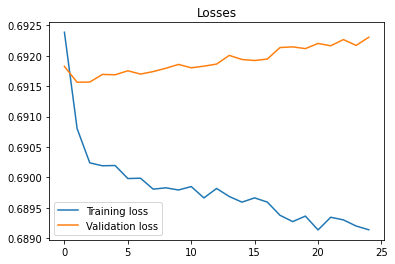

In [ ]:
model = LSTMModel(**model_params).to(device)

loss_fn = nn.BCELoss(reduction="mean")  # nn.CrossEntropyLoss()  # 
# loss_fn = nn.MSELoss(reduction='mean')
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

opt = Optimization(model=model, loss_fn=loss_fn, optimizer=optimizer)
opt.train(train_loader, val_loader, batch_size=batch_size, n_epochs=n_epochs, n_features=input_dim)
opt.plot_losses()

#### Save / Load

In [ ]:
# torch.save(model.state_dict(), DATA_DIR+"/lstm_dir_senti_10min_5")
# "/lstm_dir_senti_10min_1"  6.9178E-01 4*2 12h no sum
# "/lstm_dir_senti_10min_2"  6.9177E-01 3*3 12h no sum
# "/lstm_dir_senti_10min_3"  6.9172E-01 3*3 8h sum
# "/lstm_dir_senti_10min_4"  6.9162E-01 3*3 10h sum
# "/lstm_dir_senti_10min_5"  6.9140E-01 4*2 10h sum


In [15]:
model = LSTMModel(**model_params).to(device)
model.load_state_dict(torch.load(DATA_DIR+"/lstm_dir_senti_10min_5"))
loss_fn = nn.BCELoss(reduction='mean')
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

opt = Optimization(model=model, loss_fn=loss_fn, optimizer=optimizer)

### Result

#### Train set

              precision    recall  f1-score   support

    Negative       0.53      0.54      0.53     54162
    Positive       0.54      0.54      0.54     54382

    accuracy                           0.54    108544
   macro avg       0.54      0.54      0.54    108544
weighted avg       0.54      0.54      0.54    108544

0.5352023142688679


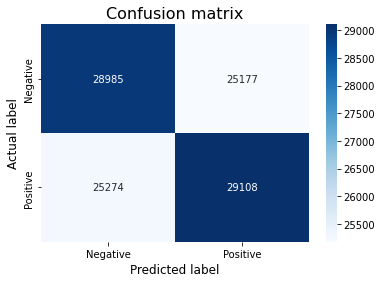

In [21]:
predictions, values = opt.evaluate(train_loader, batch_size=batch_size, n_features=input_dim)

print(classification_report(values, (np.array(predictions)>0.5).astype(int), target_names=['Negative', 'Positive']))

plot_confusion_matrix((np.array(predictions)>0.5).astype(int), values)
print(accuracy_score(values, (np.array(predictions)>0.5).astype(int)))

#### Validation set

              precision    recall  f1-score   support

    Negative       0.52      0.52      0.52     13506
    Positive       0.52      0.53      0.52     13566

    accuracy                           0.52     27072
   macro avg       0.52      0.52      0.52     27072
weighted avg       0.52      0.52      0.52     27072

0.5210549645390071


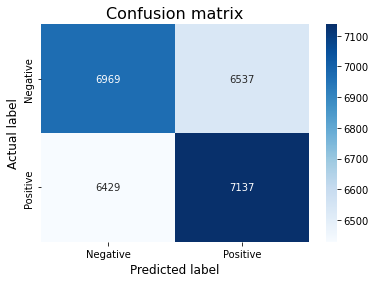

In [22]:
predictions, values = opt.evaluate(val_loader, batch_size=batch_size, n_features=input_dim)

print(classification_report(values, (np.array(predictions)>0.5).astype(int), target_names=['Negative', 'Positive']))

plot_confusion_matrix((np.array(predictions)>0.5).astype(int), values)
print(accuracy_score(values, (np.array(predictions)>0.5).astype(int)))

#### Test set

              precision    recall  f1-score   support

    Negative       0.55      0.38      0.44      8708
    Positive       0.53      0.69      0.60      8801

    accuracy                           0.53     17509
   macro avg       0.54      0.53      0.52     17509
weighted avg       0.54      0.53      0.52     17509

0.533611285624536


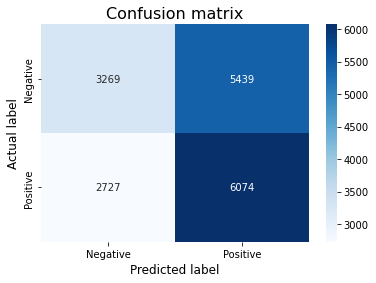

In [23]:
predictions, values = opt.evaluate(test_loader, batch_size=1, n_features=input_dim)

print(classification_report(values, (np.array(predictions)>0.50).astype(int), target_names=['Negative', 'Positive']))

plot_confusion_matrix((np.array(predictions)>0.50).astype(int), values)
print(accuracy_score(values, (np.array(predictions)>0.5).astype(int)))

### Backtest

In [ ]:
predictions, values = opt.evaluate(test_loader, batch_size=1, n_features=input_dim)


In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h].iloc[lag-1:]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472


#### Simple Strategy

In [ ]:
ohlc['prediction'] = np.array(predictions)
# ohlc['prediction'] = ohlc['prediction'].ewm(halflife=6*2).mean().fillna(0.5)
# ohlc['label'] = (
#     (ohlc['prediction']>(0.5+ (ohlc.vol1_pct*0.05 + ohlc.vol2_pct*0.05))).astype(int) 
#     - (ohlc['prediction']<(0.5 - (ohlc.vol1_pct*0.05 + ohlc.vol2_pct*0.05))).astype(int)
# )
# ohlc['label'] = ohlc['label'].rolling(3).mean()
# ohlc['label'] = (ohlc['label'] / ohlc['label'].abs()).fillna(0)
ohlc['label'] = (
    (ohlc['prediction']>(0.5)).astype(int) 
    - (ohlc['prediction']<(0.5)).astype(int)
)
# ohlc['label'] = (ohlc['label']/ohlc['label'].abs())
# ohlc['label'] = ohlc['label'].fillna(0)
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,0.497528,-1
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,0.540995,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,0.554491,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,0.586009,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,0.609951,1


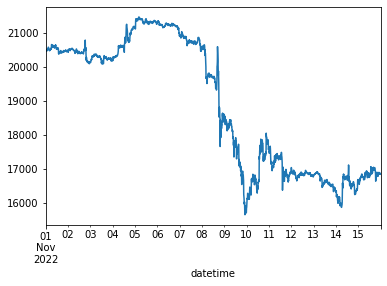

In [ ]:
ohlc.loc['2022-11-01':'2022-11-15'].Close.plot()

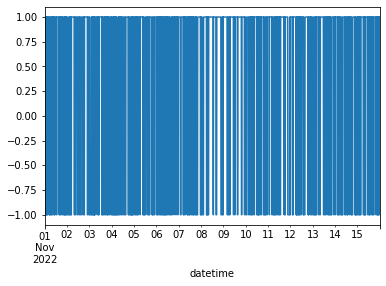

In [ ]:
ohlc.loc['2022-11-01':'2022-11-15'].label.plot()

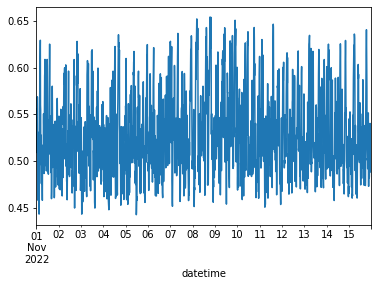

In [ ]:
ohlc.loc['2022-11-01':'2022-11-15'].prediction.plot()

In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   99.988577
Equity Final [$]                   1329589.04
Equity Peak [$]                    1557415.44
Return [%]                          32.958904
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                  135.340177
Volatility (Ann.) [%]              162.480792
Sharpe Ratio                         0.832961
Sortino Ratio                         2.79623
Calmar Ratio                         4.314011
Max. Drawdown [%]                  -31.372234
Avg. Drawdown [%]                   -1.123844
Max. Drawdown Duration       23 days 04:40:00
Avg. Drawdown Duration        0 days 16:48:00
# Trades                                 4338
Win Rate [%]                        69.663439
Best Trade [%]                       4.482598
Worst Trade [%]                    -10.583525
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7faf20c331c0>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   99.988577
 Equity Final [$]                   1329589.04
 Equity Peak [$]                    1557415.44
 Return [%]                          32.958904
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                  135.340177
 Volatility (Ann.) [%]              162.480792
 Sharpe Ratio                         0.832961
 Sortino Ratio                         2.79623
 Calmar Ratio                         4.314011
 Max. Drawdown [%]                  -31.372234
 Avg. Drawdown [%]                   -1.123844
 Max. Drawdown Duration       23 days 04:40:00
 Avg. Drawdown Duration        0 days 16:48:00
 # Trades                                 4338
 Win Rate [%]                        69.663439
 Best Trade [%]                       4.482598
 Wors

#### Volatility Control Strategy

In [ ]:
ohlc['prediction'] = np.array(predictions)
# ohlc['prediction_up'] = ohlc['prediction'].rolling(48*6).quantile(0.9).fillna(0.5)
# ohlc['prediction_down'] = ohlc['prediction'].rolling(48*6).quantile(0.1).fillna(0.5)

# ohlc['prediction'] = ohlc['prediction'].ewm(halflife=6*2).mean().fillna(0.5)
ohlc['label'] = (
    (ohlc['prediction']>(0.5+ (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.15))).astype(int) 
    - (ohlc['prediction']<(0.5 - (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.15))).astype(int)
)
# ohlc['label'] = ohlc['label'].rolling(3).mean()
# ohlc['label'] = (ohlc['label'] / ohlc['label'].abs()).fillna(0)

ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,0.497528,0
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,0.540995,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,0.554491,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,0.586009,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,0.609951,1


In [ ]:
ohlc.tail()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-11-30 23:10:00,17186.53,17193.00,17109.98,17133.09,3109.13794,0.001724,38.765932,0.798611,1.0,0.523999,0
2022-11-30 23:20:00,17134.22,17175.91,17121.28,17146.62,2276.77589,0.001721,38.842111,0.784722,1.0,0.527687,0
2022-11-30 23:30:00,17147.48,17193.26,17146.62,17172.39,1909.81109,0.001719,38.879556,0.774306,1.0,0.504007,0
2022-11-30 23:40:00,17172.39,17187.00,17135.50,17180.93,2424.01456,0.001715,38.940159,0.763889,1.0,0.497077,0
2022-11-30 23:50:00,17180.93,17227.23,17173.51,17185.69,2760.34259,0.001711,39.011131,0.746528,1.0,0.487259,0


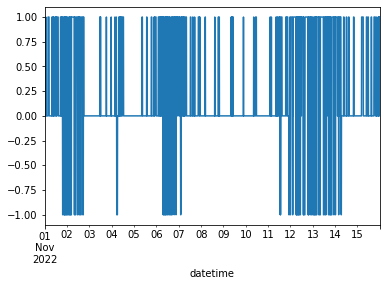

In [ ]:
ohlc.loc['2022-11-01':'2022-11-15'].label.plot()

In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   47.958193
Equity Final [$]                   1197111.82
Equity Peak [$]                    1224824.01
Return [%]                          19.711182
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                   72.713876
Volatility (Ann.) [%]               48.160806
Sharpe Ratio                         1.509814
Sortino Ratio                        4.288633
Calmar Ratio                         8.168843
Max. Drawdown [%]                   -8.901367
Avg. Drawdown [%]                   -1.013466
Max. Drawdown Duration       25 days 17:30:00
Avg. Drawdown Duration        1 days 11:23:00
# Trades                                 2100
Win Rate [%]                        69.952381
Best Trade [%]                       2.985285
Worst Trade [%]                     -3.308593
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7faf281d1340>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   47.958193
 Equity Final [$]                   1197111.82
 Equity Peak [$]                    1224824.01
 Return [%]                          19.711182
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                   72.713876
 Volatility (Ann.) [%]               48.160806
 Sharpe Ratio                         1.509814
 Sortino Ratio                        4.288633
 Calmar Ratio                         8.168843
 Max. Drawdown [%]                   -8.901367
 Avg. Drawdown [%]                   -1.013466
 Max. Drawdown Duration       25 days 17:30:00
 Avg. Drawdown Duration        1 days 11:23:00
 # Trades                                 2100
 Win Rate [%]                        69.952381
 Best Trade [%]                       2.985285
 Wors

*****

## Tabnet

### Model Setting

In [24]:
from pytorch_tabnet.tab_model import TabNetClassifier
from pytorch_tabnet.pretraining import TabNetPretrainer

#### unsupervised model

In [ ]:
unsupervised_model = TabNetPretrainer(
    optimizer_fn=torch.optim.Adam,
    optimizer_params=dict(lr=2e-2),
    mask_type='entmax' # "sparsemax"
)

#### classification model

In [ ]:
clf = TabNetClassifier(optimizer_fn=torch.optim.Adam,
                       optimizer_params=dict(lr=2e-2),
                       scheduler_params={"step_size":10, # how to use learning rate scheduler
                                         "gamma":0.9},
                       scheduler_fn=torch.optim.lr_scheduler.StepLR,
                       mask_type='sparsemax' # This will be overwritten if using pretrain model
                      )

### Train

In [27]:
data_set = price_senti('BTCUSDT', '10min', if_CDL=True)

train_start = '2020-01-01'
train_end = '2022-07-31'
test_start = '2022-08-01'

h = 1
lag = 0
if_pca = False
# pca_col_start = 7
# pca_col_end = -4

X_train, Y_train, X_valid, Y_valid, X_test, Y_test = prepare_data(data_set, h, train_start, train_end, test_start, lag=lag, validate_ratio=0.2, batch_size=64, 
                 y_col_num=3, if_pca=if_pca, pca_col_start=None, pca_col_end=None, if_dataloader=False)

X_train.shape:(108632, 157) Y_train.shape:(108632,)
 X_valid.shape:(27159, 157) Y_valid.shape:(27159,)
 X_test.shape:(17568, 157) Y_test.shape:(17568,)


#### pretrain unsupervised

In [ ]:
unsupervised_model.fit(
    X_train=X_train,
    eval_set=[X_valid],
    pretraining_ratio=0.8,
)

##### save / load

In [ ]:
# unsupervised_model.save_model(DATA_DIR+'test_pretrain2')
# test_pretrain  0.9356799721717834  no PCA include CDL
# test_pretrain2  0.9045799970626831  no PCA exclude CDL

In [ ]:
unsupervised_model = TabNetPretrainer()
unsupervised_model.load_model(DATA_DIR+'test_pretrain2.zip')

#### train classification

In [ ]:
clf.fit(
    X_train=X_train, y_train=Y_train,
    eval_set=[(X_valid, Y_valid)],
    eval_metric=['auc'],
    from_unsupervised=unsupervised_model
)

##### save / load

In [ ]:
# saved_filepath = clf.save_model(DATA_DIR+"/tabnet_dir_senti_10min_4")
# tabnet_dir_senti_10min_1   0.53565  include CDL +PCA
# tabnet_dir_senti_10min_2   0.5333  include CDL no PCA
# tabnet_dir_senti_10min_3   0.53483  include CDL no PCA + pretrain 'test_pretrain'
# tabnet_dir_senti_10min_4   0.53871  exclude CDL no PCA + pretrain 'test_pretrain2'  xx trade bad

In [25]:
clf = TabNetClassifier()
clf.load_model(DATA_DIR+"/tabnet_dir_senti_10min_3.zip")

### Result

In [28]:
Y_test_hat = clf.predict(X_test)
Y_train_hat = clf.predict(X_train)
Y_valid_hat = clf.predict(X_valid)
Y_test_prob = clf.predict_proba(X_test)[:, 1]

#### Train set

              precision    recall  f1-score   support

    Negative       0.52      0.64      0.58     54210
    Positive       0.54      0.42      0.47     54422

    accuracy                           0.53    108632
   macro avg       0.53      0.53      0.52    108632
weighted avg       0.53      0.53      0.52    108632

0.528030414610796


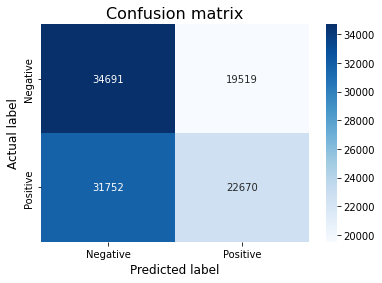

In [29]:
print(classification_report(Y_train, Y_train_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_train_hat, Y_train)
print(accuracy_score(Y_train, Y_train_hat))

#### Validation set

              precision    recall  f1-score   support

    Negative       0.52      0.53      0.53     13551
    Positive       0.53      0.52      0.52     13608

    accuracy                           0.53     27159
   macro avg       0.53      0.53      0.53     27159
weighted avg       0.53      0.53      0.53     27159

0.5259398357818771


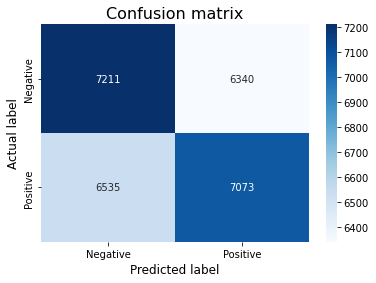

In [30]:
print(classification_report(Y_valid, Y_valid_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_valid_hat, Y_valid)
print(accuracy_score(Y_valid, Y_valid_hat))

#### Test set

              precision    recall  f1-score   support

    Negative       0.53      0.51      0.52      8736
    Positive       0.53      0.55      0.54      8832

    accuracy                           0.53     17568
   macro avg       0.53      0.53      0.53     17568
weighted avg       0.53      0.53      0.53     17568

0.533356102003643


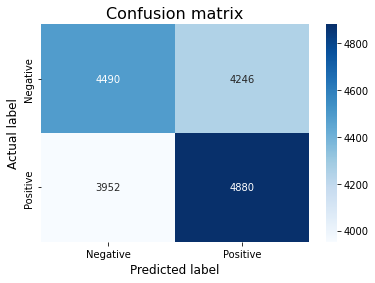

In [31]:
print(classification_report(Y_test, Y_test_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_test_hat, Y_test)
print(accuracy_score(Y_test, Y_test_hat))

### Backtest

#### Simple Strategy

In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528


In [ ]:
ohlc['label'] = Y_test_hat*2-1
# ohlc['label'] = (ohlc['label']/ohlc['label'].abs())
# ohlc['label'] = ohlc['label'].fillna(0)
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,label
datetime,,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306,1
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889,1
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472,1
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417,1
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528,-1


In [ ]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,label
datetime,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,-1
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,1


In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   99.988577
Equity Final [$]                   1443184.13
Equity Peak [$]                    1611534.07
Return [%]                          44.318413
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                  204.106167
Volatility (Ann.) [%]              185.279196
Sharpe Ratio                         1.101614
Sortino Ratio                        5.015224
Calmar Ratio                          7.80092
Max. Drawdown [%]                  -26.164373
Avg. Drawdown [%]                   -1.136283
Max. Drawdown Duration       23 days 06:30:00
Avg. Drawdown Duration        0 days 18:18:00
# Trades                                 3998
Win Rate [%]                        67.108554
Best Trade [%]                       4.482598
Worst Trade [%]                     -7.183244
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fd0c44043d0>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   99.988577
 Equity Final [$]                   1443184.13
 Equity Peak [$]                    1611534.07
 Return [%]                          44.318413
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                  204.106167
 Volatility (Ann.) [%]              185.279196
 Sharpe Ratio                         1.101614
 Sortino Ratio                        5.015224
 Calmar Ratio                          7.80092
 Max. Drawdown [%]                  -26.164373
 Avg. Drawdown [%]                   -1.136283
 Max. Drawdown Duration       23 days 06:30:00
 Avg. Drawdown Duration        0 days 18:18:00
 # Trades                                 3998
 Win Rate [%]                        67.108554
 Best Trade [%]                       4.482598
 Wors

#### Volatility Control Strategy

In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528


In [ ]:
ohlc['prediction'] = Y_test_prob

# ohlc['prediction'] = ohlc['prediction'].ewm(halflife=6*2).mean().fillna(0.5)
ohlc['label'] = (
    (ohlc['prediction']>(0.5+ (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.12))).astype(int) 
    - (ohlc['prediction']<(0.5 - (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.12))).astype(int)
)
# ohlc['label'] = ohlc['label'].rolling(3).mean()
# ohlc['label'] = (ohlc['label'] / ohlc['label'].abs()).fillna(0)

ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306,0.510438,0
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889,0.520529,0
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472,0.522114,0
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417,0.501612,0
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528,0.487698,0


In [ ]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,0.471651,-1
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,0.508367,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,0.546486,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,0.554432,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,0.562790,1


In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   47.004398
Equity Final [$]                   1256979.75
Equity Peak [$]                    1274796.46
Return [%]                          25.697975
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                  100.870288
Volatility (Ann.) [%]               63.100291
Sharpe Ratio                         1.598571
Sortino Ratio                        5.118408
Calmar Ratio                        11.572097
Max. Drawdown [%]                   -8.716682
Avg. Drawdown [%]                   -0.844474
Max. Drawdown Duration       40 days 04:50:00
Avg. Drawdown Duration        1 days 01:09:00
# Trades                                 2040
Win Rate [%]                        68.431373
Best Trade [%]                       3.142329
Worst Trade [%]                     -4.181261
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fd0c7ca78e0>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   47.004398
 Equity Final [$]                   1256979.75
 Equity Peak [$]                    1274796.46
 Return [%]                          25.697975
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                  100.870288
 Volatility (Ann.) [%]               63.100291
 Sharpe Ratio                         1.598571
 Sortino Ratio                        5.118408
 Calmar Ratio                        11.572097
 Max. Drawdown [%]                   -8.716682
 Avg. Drawdown [%]                   -0.844474
 Max. Drawdown Duration       40 days 04:50:00
 Avg. Drawdown Duration        1 days 01:09:00
 # Trades                                 2040
 Win Rate [%]                        68.431373
 Best Trade [%]                       3.142329
 Wors

## Random Forest


In [32]:
from sklearn.ensemble import RandomForestClassifier  # , AdaBoostRegressor

data_set = price_senti('BTCUSDT', '10min', if_CDL=True)

train_start = '2020-01-01'
train_end = '2022-07-31'
test_start = '2022-08-01'

h = 1
lag = 0
if_pca = False
# pca_col_start = 7
# pca_col_end = -4

X_train, Y_train, X_valid, Y_valid, X_test, Y_test = prepare_data(data_set, h, train_start, train_end, test_start, lag=lag, validate_ratio=0.2, batch_size=64, 
                 y_col_num=3, if_pca=if_pca, pca_col_start=None, pca_col_end=None, if_dataloader=False)

X_train.shape:(108632, 157) Y_train.shape:(108632,)
 X_valid.shape:(27159, 157) Y_valid.shape:(27159,)
 X_test.shape:(17568, 157) Y_test.shape:(17568,)


### Model Setting & Train


In [33]:
rf = RandomForestClassifier(n_estimators=20, max_depth=5)
rf.fit(X_train, Y_train)

RandomForestClassifier(max_depth=5, n_estimators=20)

### Result

In [34]:
Y_test_hat = rf.predict(X_test)
Y_train_hat = rf.predict(X_train)
Y_valid_hat = rf.predict(X_valid)
Y_test_prob = rf.predict_proba(X_test)[:, 1]

#### Train set

              precision    recall  f1-score   support

    Negative       0.54      0.53      0.54     54210
    Positive       0.54      0.56      0.55     54422

    accuracy                           0.54    108632
   macro avg       0.54      0.54      0.54    108632
weighted avg       0.54      0.54      0.54    108632

0.5421883054716842


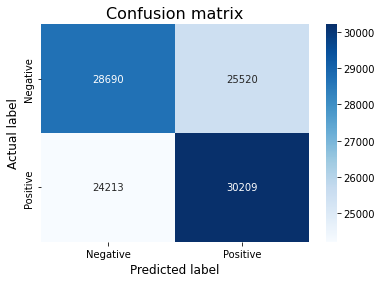

In [35]:
print(classification_report(Y_train, Y_train_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_train_hat, Y_train)
print(accuracy_score(Y_train, Y_train_hat))

#### Validation set

              precision    recall  f1-score   support

    Negative       0.52      0.51      0.52     13551
    Positive       0.52      0.54      0.53     13608

    accuracy                           0.52     27159
   macro avg       0.52      0.52      0.52     27159
weighted avg       0.52      0.52      0.52     27159

0.523583342538385


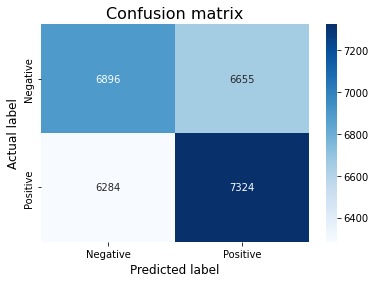

In [36]:
print(classification_report(Y_valid, Y_valid_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_valid_hat, Y_valid)
print(accuracy_score(Y_valid, Y_valid_hat))


#### Test set

              precision    recall  f1-score   support

    Negative       0.54      0.42      0.47      8736
    Positive       0.53      0.64      0.58      8832

    accuracy                           0.53     17568
   macro avg       0.53      0.53      0.53     17568
weighted avg       0.53      0.53      0.53     17568

0.5318192167577414


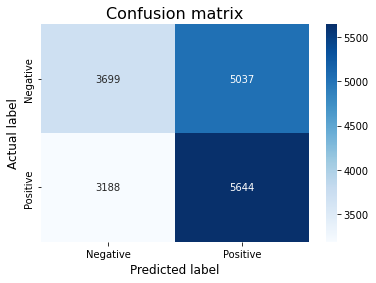

In [37]:
print(classification_report(Y_test, Y_test_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_test_hat, Y_test)
print(accuracy_score(Y_test, Y_test_hat))


### Backtest

#### Simple Strategy

In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528


In [ ]:
ohlc['label'] = Y_test_hat*2-1
# ohlc['label'] = (ohlc['label']/ohlc['label'].abs())
# ohlc['label'] = ohlc['label'].fillna(0)
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,label
datetime,,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306,1
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889,1
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472,1
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417,1
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528,1


In [ ]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,label
datetime,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,-1
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,1


In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   99.988577
Equity Final [$]                    912547.47
Equity Peak [$]                    1257163.29
Return [%]                          -8.745253
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                  -20.233849
Volatility (Ann.) [%]               47.158672
Sharpe Ratio                              0.0
Sortino Ratio                             0.0
Calmar Ratio                              0.0
Max. Drawdown [%]                  -31.292078
Avg. Drawdown [%]                   -1.279078
Max. Drawdown Duration       35 days 19:00:00
Avg. Drawdown Duration        1 days 06:15:00
# Trades                                 3915
Win Rate [%]                        67.484036
Best Trade [%]                       4.346499
Worst Trade [%]                    -10.957936
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fd0c76f8ac0>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   99.988577
 Equity Final [$]                    912547.47
 Equity Peak [$]                    1257163.29
 Return [%]                          -8.745253
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                  -20.233849
 Volatility (Ann.) [%]               47.158672
 Sharpe Ratio                              0.0
 Sortino Ratio                             0.0
 Calmar Ratio                              0.0
 Max. Drawdown [%]                  -31.292078
 Avg. Drawdown [%]                   -1.279078
 Max. Drawdown Duration       35 days 19:00:00
 Avg. Drawdown Duration        1 days 06:15:00
 # Trades                                 3915
 Win Rate [%]                        67.484036
 Best Trade [%]                       4.346499
 Wors

#### Volatility Control Strategy

In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528


In [ ]:
ohlc['prediction'] = Y_test_prob

# ohlc['prediction'] = ohlc['prediction'].ewm(halflife=6*2).mean().fillna(0.5)
ohlc['label'] = (
    (ohlc['prediction']>(0.5+ (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.12))).astype(int) 
    - (ohlc['prediction']<(0.5 - (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.12))).astype(int)
)
# ohlc['label'] = ohlc['label'].rolling(3).mean()
# ohlc['label'] = (ohlc['label'] / ohlc['label'].abs()).fillna(0)

ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306,0.544155,1
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889,0.538643,1
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472,0.543509,1
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417,0.515935,0
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528,0.509686,0


In [ ]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,0.487318,-1
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,0.509823,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,0.541420,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,0.585907,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,0.628401,1


In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   48.026729
Equity Final [$]                    997685.85
Equity Peak [$]                    1056625.51
Return [%]                          -0.231415
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                     6.39852
Volatility (Ann.) [%]               29.353941
Sharpe Ratio                         0.217978
Sortino Ratio                        0.338369
Calmar Ratio                         0.596609
Max. Drawdown [%]                  -10.724822
Avg. Drawdown [%]                   -1.670603
Max. Drawdown Duration       66 days 11:00:00
Avg. Drawdown Duration        4 days 00:51:00
# Trades                                 2103
Win Rate [%]                        67.760342
Best Trade [%]                       1.394617
Worst Trade [%]                     -3.578188
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fd0c73aac40>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   48.026729
 Equity Final [$]                    997685.85
 Equity Peak [$]                    1056625.51
 Return [%]                          -0.231415
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                     6.39852
 Volatility (Ann.) [%]               29.353941
 Sharpe Ratio                         0.217978
 Sortino Ratio                        0.338369
 Calmar Ratio                         0.596609
 Max. Drawdown [%]                  -10.724822
 Avg. Drawdown [%]                   -1.670603
 Max. Drawdown Duration       66 days 11:00:00
 Avg. Drawdown Duration        4 days 00:51:00
 # Trades                                 2103
 Win Rate [%]                        67.760342
 Best Trade [%]                       1.394617
 Wors

## Adaboost

In [38]:
from sklearn.ensemble import AdaBoostClassifier  # , AdaBoostRegressor

data_set = price_senti('BTCUSDT', '10min', if_CDL=True)

train_start = '2020-01-01'
train_end = '2022-07-31'
test_start = '2022-08-01'

h = 1
lag = 0
if_pca = False
# pca_col_start = 7
# pca_col_end = -4

X_train, Y_train, X_valid, Y_valid, X_test, Y_test = prepare_data(data_set, h, train_start, train_end, test_start, lag=lag, validate_ratio=0.2, batch_size=64, 
                 y_col_num=3, if_pca=if_pca, pca_col_start=None, pca_col_end=None, if_dataloader=False)

X_train.shape:(108632, 157) Y_train.shape:(108632,)
 X_valid.shape:(27159, 157) Y_valid.shape:(27159,)
 X_test.shape:(17568, 157) Y_test.shape:(17568,)


### Model Setting & Train


In [39]:
reg = AdaBoostClassifier(n_estimators=20)
reg.fit(X_train, Y_train)

AdaBoostClassifier(n_estimators=20)

### Result

In [40]:
Y_test_hat = reg.predict(X_test)
Y_train_hat = reg.predict(X_train)
Y_valid_hat = reg.predict(X_valid)
Y_test_prob = reg.predict_proba(X_test)[:, 1]

#### Train set

              precision    recall  f1-score   support

    Negative       0.54      0.48      0.51     54210
    Positive       0.54      0.60      0.56     54422

    accuracy                           0.54    108632
   macro avg       0.54      0.54      0.54    108632
weighted avg       0.54      0.54      0.54    108632

0.5384693276382649


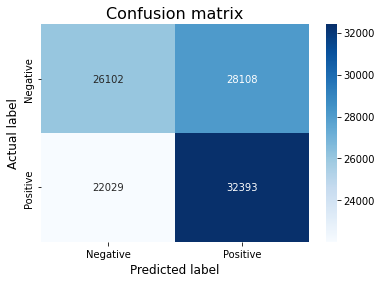

In [41]:
print(classification_report(Y_train, Y_train_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_train_hat, Y_train)
print(accuracy_score(Y_train, Y_train_hat))


#### Validation set

              precision    recall  f1-score   support

    Negative       0.52      0.47      0.50     13551
    Positive       0.52      0.57      0.54     13608

    accuracy                           0.52     27159
   macro avg       0.52      0.52      0.52     27159
weighted avg       0.52      0.52      0.52     27159

0.5191649177068375


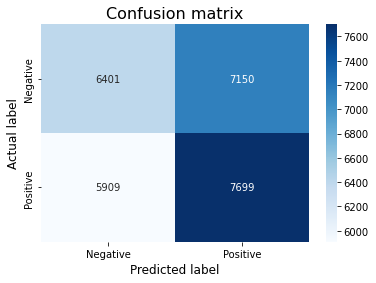

In [42]:
print(classification_report(Y_valid, Y_valid_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_valid_hat, Y_valid)
print(accuracy_score(Y_valid, Y_valid_hat))


#### Test set

              precision    recall  f1-score   support

    Negative       0.54      0.35      0.42      8736
    Positive       0.52      0.70      0.60      8832

    accuracy                           0.53     17568
   macro avg       0.53      0.53      0.51     17568
weighted avg       0.53      0.53      0.51     17568

0.5260132058287796


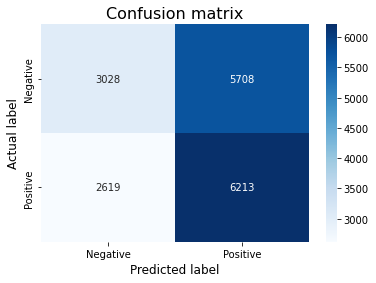

In [43]:
print(classification_report(Y_test, Y_test_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_test_hat, Y_test)
print(accuracy_score(Y_test, Y_test_hat))


### Backtest

#### Simple Strategy

In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528


In [ ]:
ohlc['label'] = Y_test_hat*2-1
# ohlc['label'] = (ohlc['label']/ohlc['label'].abs())
# ohlc['label'] = ohlc['label'].fillna(0)
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,label
datetime,,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306,1
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889,1
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472,1
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417,1
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528,-1


In [ ]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,label
datetime,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,-1
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,1


In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   99.988577
Equity Final [$]                   1290413.58
Equity Peak [$]                     1542497.1
Return [%]                          29.041358
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                  116.768833
Volatility (Ann.) [%]              145.618798
Sharpe Ratio                          0.80188
Sortino Ratio                        2.415824
Calmar Ratio                         4.190524
Max. Drawdown [%]                  -27.864974
Avg. Drawdown [%]                   -1.132454
Max. Drawdown Duration       38 days 19:50:00
Avg. Drawdown Duration        0 days 18:41:00
# Trades                                 4249
Win Rate [%]                        67.145211
Best Trade [%]                       5.484015
Worst Trade [%]                    -10.014826
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fd0c6c25580>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   99.988577
 Equity Final [$]                   1290413.58
 Equity Peak [$]                     1542497.1
 Return [%]                          29.041358
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                  116.768833
 Volatility (Ann.) [%]              145.618798
 Sharpe Ratio                          0.80188
 Sortino Ratio                        2.415824
 Calmar Ratio                         4.190524
 Max. Drawdown [%]                  -27.864974
 Avg. Drawdown [%]                   -1.132454
 Max. Drawdown Duration       38 days 19:50:00
 Avg. Drawdown Duration        0 days 18:41:00
 # Trades                                 4249
 Win Rate [%]                        67.145211
 Best Trade [%]                       5.484015
 Wors

#### Volatility Control Strategy

In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528


In [ ]:
ohlc['prediction'] = Y_test_prob

# ohlc['prediction'] = ohlc['prediction'].ewm(halflife=6*2).mean().fillna(0.5)
ohlc['label'] = (
    (ohlc['prediction']>(0.5+ (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.1))).astype(int) 
    - (ohlc['prediction']<(0.5 - (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.1))).astype(int)
)
# ohlc['label'] = ohlc['label'].rolling(3).mean()
# ohlc['label'] = (ohlc['label'] / ohlc['label'].abs()).fillna(0)

ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306,0.503724,0
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889,0.500510,0
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472,0.500510,0
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417,0.500510,0
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528,0.499075,0


In [ ]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,0.499075,0
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,0.500510,0
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,0.503724,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,0.505285,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,0.508055,1


In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   22.451311
Equity Final [$]                   1002220.53
Equity Peak [$]                    1022561.88
Return [%]                           0.222053
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                     2.41613
Volatility (Ann.) [%]               14.913117
Sharpe Ratio                         0.162014
Sortino Ratio                        0.233636
Calmar Ratio                         0.258692
Max. Drawdown [%]                   -9.339796
Avg. Drawdown [%]                   -0.672453
Max. Drawdown Duration      115 days 07:30:00
Avg. Drawdown Duration        5 days 17:58:00
# Trades                                 1165
Win Rate [%]                        66.523605
Best Trade [%]                       0.981526
Worst Trade [%]                     -3.578188
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fd0c62c5d00>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   22.451311
 Equity Final [$]                   1002220.53
 Equity Peak [$]                    1022561.88
 Return [%]                           0.222053
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                     2.41613
 Volatility (Ann.) [%]               14.913117
 Sharpe Ratio                         0.162014
 Sortino Ratio                        0.233636
 Calmar Ratio                         0.258692
 Max. Drawdown [%]                   -9.339796
 Avg. Drawdown [%]                   -0.672453
 Max. Drawdown Duration      115 days 07:30:00
 Avg. Drawdown Duration        5 days 17:58:00
 # Trades                                 1165
 Win Rate [%]                        66.523605
 Best Trade [%]                       0.981526
 Wors

## xgboost

In [44]:
from xgboost import XGBClassifier

In [45]:
data_set = price_senti('BTCUSDT', '10min', if_CDL=True)

train_start = '2020-01-01'
train_end = '2022-07-31'
test_start = '2022-08-01'

h = 1
lag = 0
if_pca = False
# pca_col_start = 7
# pca_col_end = -4

X_train, Y_train, X_valid, Y_valid, X_test, Y_test = prepare_data(data_set, h, train_start, train_end, test_start, lag=lag, validate_ratio=0.2, batch_size=64, 
                 y_col_num=3, if_pca=if_pca, pca_col_start=None, pca_col_end=None, if_dataloader=False)

X_train.shape:(108632, 157) Y_train.shape:(108632,)
 X_valid.shape:(27159, 157) Y_valid.shape:(27159,)
 X_test.shape:(17568, 157) Y_test.shape:(17568,)


### Model Setting & Train


In [46]:
xgb = XGBClassifier(n_estimators=20)
xgb.fit(X_train, Y_train)

XGBClassifier(n_estimators=20)

### Result

In [47]:
Y_test_hat = xgb.predict(X_test)
Y_train_hat = xgb.predict(X_train)
Y_valid_hat = xgb.predict(X_valid)
Y_test_prob = xgb.predict_proba(X_test)[:, 1]

#### Train set

              precision    recall  f1-score   support

    Negative       0.54      0.44      0.49     54210
    Positive       0.53      0.63      0.58     54422

    accuracy                           0.54    108632
   macro avg       0.54      0.54      0.53    108632
weighted avg       0.54      0.54      0.53    108632

0.537125340599455


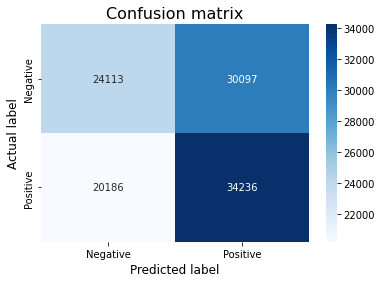

In [48]:
print(classification_report(Y_train, Y_train_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_train_hat, Y_train)
print(accuracy_score(Y_train, Y_train_hat))


#### Validation set

              precision    recall  f1-score   support

    Negative       0.53      0.41      0.46     13551
    Positive       0.52      0.63      0.57     13608

    accuracy                           0.52     27159
   macro avg       0.52      0.52      0.52     27159
weighted avg       0.52      0.52      0.52     27159

0.5236569829522442


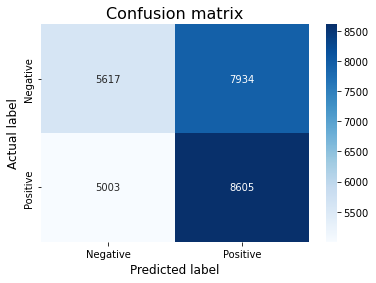

In [49]:
print(classification_report(Y_valid, Y_valid_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_valid_hat, Y_valid)
print(accuracy_score(Y_valid, Y_valid_hat))


#### Test set

              precision    recall  f1-score   support

    Negative       0.54      0.35      0.42      8736
    Positive       0.52      0.71      0.60      8832

    accuracy                           0.53     17568
   macro avg       0.53      0.53      0.51     17568
weighted avg       0.53      0.53      0.51     17568

0.5285177595628415


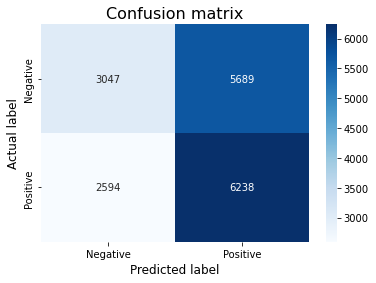

In [50]:
print(classification_report(Y_test, Y_test_hat, target_names=['Negative', 'Positive']))

plot_confusion_matrix(Y_test_hat, Y_test)
print(accuracy_score(Y_test, Y_test_hat))


### Backtest

#### Simple Strategy

In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528


In [ ]:
ohlc['label'] = Y_test_hat*2-1
# ohlc['label'] = (ohlc['label']/ohlc['label'].abs())
# ohlc['label'] = ohlc['label'].fillna(0)
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,label
datetime,,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306,1
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889,1
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472,1
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417,1
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528,1


In [ ]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,label
datetime,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,-1
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,1


In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   99.988577
Equity Final [$]                   1066276.98
Equity Peak [$]                    1156513.86
Return [%]                           6.627698
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                   27.706666
Volatility (Ann.) [%]                84.68739
Sharpe Ratio                         0.327164
Sortino Ratio                        0.629082
Calmar Ratio                         1.146837
Max. Drawdown [%]                  -24.159193
Avg. Drawdown [%]                   -1.351508
Max. Drawdown Duration       79 days 20:20:00
Avg. Drawdown Duration        1 days 21:24:00
# Trades                                 4176
Win Rate [%]                        68.199234
Best Trade [%]                       5.484015
Worst Trade [%]                     -9.268354
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fd0c6ea2be0>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   99.988577
 Equity Final [$]                   1066276.98
 Equity Peak [$]                    1156513.86
 Return [%]                           6.627698
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                   27.706666
 Volatility (Ann.) [%]                84.68739
 Sharpe Ratio                         0.327164
 Sortino Ratio                        0.629082
 Calmar Ratio                         1.146837
 Max. Drawdown [%]                  -24.159193
 Avg. Drawdown [%]                   -1.351508
 Max. Drawdown Duration       79 days 20:20:00
 Avg. Drawdown Duration        1 days 21:24:00
 # Trades                                 4176
 Win Rate [%]                        68.199234
 Best Trade [%]                       5.484015
 Wors

#### Volatility Control Strategy

In [ ]:
ohlc = data_set.iloc[:, :5].copy()
ohlc['vol1'] = ohlc.close.pct_change().ewm(halflife=24*6).std()
ohlc['vol2'] = (ohlc.high - ohlc.low).ewm(halflife=24*6).mean()
ohlc['vol1_pct'] = ohlc.vol1.rolling(48*6).rank(pct=True)
ohlc['vol2_pct'] = ohlc.vol2.rolling(48*6).rank(pct=True)

ohlc = ohlc.loc[test_start:].iloc[:-h]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume", 'vol1', 'vol2', 'vol1_pct', 'vol2_pct']
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct
datetime,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528


In [ ]:
ohlc['prediction'] = Y_test_prob

# ohlc['prediction'] = ohlc['prediction'].ewm(halflife=6*2).mean().fillna(0.5)
ohlc['label'] = (
    (ohlc['prediction']>(0.5+ (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.1))).astype(int) 
    - (ohlc['prediction']<(0.5 - (ohlc.vol1_pct*0.5 + ohlc.vol2_pct*0.5) * (0.1))).astype(int)
)
# ohlc['label'] = ohlc['label'].rolling(3).mean()
# ohlc['label'] = (ohlc['label'] / ohlc['label'].abs()).fillna(0)

ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0.002828,91.256495,0.340278,0.274306,0.552881,1
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0.002822,91.108083,0.319444,0.263889,0.536672,1
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0.002815,91.025643,0.291667,0.253472,0.540317,1
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0.002816,91.081895,0.295139,0.260417,0.505746,0
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0.002809,90.981381,0.270833,0.246528,0.500705,0


In [ ]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,vol1,vol2,vol1_pct,vol2_pct,prediction,label
datetime,,,,,,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0.002547,82.614790,0.059028,0.003472,0.492814,-1
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0.002542,82.567996,0.055556,0.003472,0.511553,1
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0.002537,82.368820,0.052083,0.003472,0.547939,1
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0.002531,82.170697,0.048611,0.003472,0.584669,1
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0.002526,81.902217,0.045139,0.003472,0.647404,1


In [ ]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                   50.282712
Equity Final [$]                    990455.79
Equity Peak [$]                    1027463.79
Return [%]                          -0.954421
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                   -2.343603
Volatility (Ann.) [%]                28.74274
Sharpe Ratio                              0.0
Sortino Ratio                             0.0
Calmar Ratio                              0.0
Max. Drawdown [%]                  -20.015316
Avg. Drawdown [%]                   -1.868303
Max. Drawdown Duration      115 days 11:00:00
Avg. Drawdown Duration        7 days 13:58:00
# Trades                                 2425
Win Rate [%]                        66.474227
Best Trade [%]                       2.985285
Worst Trade [%]                      -3.80029
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fd0c06e0b20>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                   50.282712
 Equity Final [$]                    990455.79
 Equity Peak [$]                    1027463.79
 Return [%]                          -0.954421
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                   -2.343603
 Volatility (Ann.) [%]                28.74274
 Sharpe Ratio                              0.0
 Sortino Ratio                             0.0
 Calmar Ratio                              0.0
 Max. Drawdown [%]                  -20.015316
 Avg. Drawdown [%]                   -1.868303
 Max. Drawdown Duration      115 days 11:00:00
 Avg. Drawdown Duration        7 days 13:58:00
 # Trades                                 2425
 Win Rate [%]                        66.474227
 Best Trade [%]                       2.985285
 Wors

In [12]:
data_set = price_data('BTCUSDT', '10min')
ohlc = data_set.iloc[:, :5].copy()

ohlc = ohlc.loc['2022-08-01':].iloc[:-1]
ohlc.columns = ["Open", "High", "Low", "Close", "Volume"]
ohlc['label'] = 0

ohlc.head()

,Open,High,Low,Close,Volume,label
datetime,,,,,,
2022-08-01 00:00:00,23383.60,23386.64,23262.27,23280.77,1359.27411,0
2022-08-01 00:10:00,23280.77,23317.72,23257.37,23298.91,1061.82131,0
2022-08-01 00:20:00,23300.00,23339.05,23265.11,23290.91,972.06190,0
2022-08-01 00:30:00,23290.91,23378.93,23276.19,23358.45,881.38941,0
2022-08-01 00:40:00,23358.45,23391.21,23321.06,23350.00,663.92325,0


In [13]:
ohlc = ohlc.loc['2022-08-01 09:50:00':]
ohlc.head()

,Open,High,Low,Close,Volume,label
datetime,,,,,,
2022-08-01 09:50:00,23356.90,23377.64,23326.86,23335.89,706.85922,0
2022-08-01 10:00:00,23334.38,23347.87,23275.00,23312.57,801.51623,0
2022-08-01 10:10:00,23311.04,23319.84,23278.75,23285.87,673.12752,0
2022-08-01 10:20:00,23285.38,23303.13,23262.02,23268.36,695.01591,0
2022-08-01 10:30:00,23268.36,23271.26,23245.00,23247.38,678.07150,0


In [14]:
backtesting_df(ohlc, 'Close', 'label', commission=0.000)

Start                     2022-08-01 09:50:00
End                       2022-11-30 23:50:00
Duration                    121 days 14:00:00
Exposure Time [%]                         0.0
Equity Final [$]                    1000000.0
Equity Peak [$]                     1000000.0
Return [%]                                0.0
Buy & Hold Return [%]              -26.355112
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     0.0
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              NaN
Max. Drawdown [%]                        -0.0
Avg. Drawdown [%]                         NaN
Max. Drawdown Duration                    NaN
Avg. Drawdown Duration                    NaN
# Trades                                    0
Win Rate [%]                              NaN
Best Trade [%]                            NaN
Worst Trade [%]                           NaN
Avg. Trade [%]                    

(<backtesting.backtesting.Backtest at 0x7fcf0cc62c10>,
 Start                     2022-08-01 09:50:00
 End                       2022-11-30 23:50:00
 Duration                    121 days 14:00:00
 Exposure Time [%]                         0.0
 Equity Final [$]                    1000000.0
 Equity Peak [$]                     1000000.0
 Return [%]                                0.0
 Buy & Hold Return [%]              -26.355112
 Return (Ann.) [%]                         0.0
 Volatility (Ann.) [%]                     0.0
 Sharpe Ratio                              NaN
 Sortino Ratio                             NaN
 Calmar Ratio                              NaN
 Max. Drawdown [%]                        -0.0
 Avg. Drawdown [%]                         NaN
 Max. Drawdown Duration                    NaN
 Avg. Drawdown Duration                    NaN
 # Trades                                    0
 Win Rate [%]                              NaN
 Best Trade [%]                            NaN
 Wors